In [23]:
from typing import List
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
import pyro
import pyro.distributions as dist
import pyro.optim as optim
import seaborn as sns
import torch
from pyro.infer import SVI, Predictive, Trace_ELBO
from pyro.infer.autoguide import AutoMultivariateNormal, init_to_mean
import plotly.express as px
import collab.foraging.toolkit as ft

from collab.utils import find_repo_root
root = find_repo_root()
import logging
import time

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(message)s")
derivation_logger = logging.getLogger(__name__)

# Hyperparameters for each fish age

In [115]:
exp_names = ["2wpf_091522_3", "4wpf_060222_5", "6wpf_091522_2", "8wpf_070122_1"]
arena_size = [150,300,300,300] #in mm

# params for discretization 
frame_spacing = [120,40,40,20]
grid_size = [150,150,150,150]

# local windows
window_size = 10 #grid units
sampling_fraction = 0.6

# grid constraint
def circular_constraint_func(grid, c_x, c_y, R):
    ind = ((grid["x"] - c_x) ** 2 + (grid["y"] - c_y) ** 2) < R**2
    return grid.loc[ind]

# interaction length (same for all predictors)
L = 50 # units : mm. Note that numerical value may differ for each age after unit conversion

# velocity predictors
sigma_v = 4 # units : mm/frame_spacing, i.e. we only need to convert length units. Numerical value may be different for each age after unit conversion!
sigma_t = 1 # units : rds. Same for all ages

# proximity predictor parameters. These are different for each age as they scale with bodylength!
# need to convert these values from mm to grid units!
repulsion_radius = [4, 7, 10, 12] #mm
optimal_proximity = [6, 10.5, 15, 18] #mm
proximity_decay = 0.1 #(mm)^-1

# score_kwargs
decay_length = 6 #grid units

# Generate predictors

In [116]:
def get_derivedDF(exp : str, exp_index : int):
    print("-"*50)
    print(f"Computing derivedDF for experiment: {exp}")
    print("-"*50)
    start = time.time()
    raw_data = pd.read_csv(
        os.path.join(
            root,
            f"data/foraging/fish/{exp}.csv",
        )
    )

    # generate data object after subsampling
    processed_data = ft.rescale_to_grid(ft.subsample_frames_constant_frame_rate(raw_data, frame_spacing=frame_spacing[exp_index]), gridMax=arena_size[exp_index], size=grid_size[exp_index])
    object = ft.dataObject(foragersDF=processed_data, grid_size=grid_size[exp_index])

    # create dictionaries for predictor/score kwargs by changing to appropriate units
    length_conversion = grid_size[exp_index]/arena_size[exp_index] #grid_units / mm

    grid_constraint_params = {
        "c_x": grid_size[exp_index]/ 2,
        "c_y": grid_size[exp_index]/ 2,
        "R": grid_size[exp_index]/ 2,
    }

    predictor_kwargs = {
        "proximity": {
            "interaction_length": L * length_conversion,
            "optimal_distance": optimal_proximity[exp_index] * length_conversion,
            "repulsion_radius": repulsion_radius[exp_index] * length_conversion,
            "proximity_decay": proximity_decay / length_conversion,
        },

        "vicsek": {
            "interaction_length" : L* length_conversion,
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        },

        "velocityDiffusion": {
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        }
    }

    local_windows_kwargs = {
        "window_size": window_size,
        "sampling_fraction": sampling_fraction,
        "skip_incomplete_frames": True,
        "grid_constraint" : circular_constraint_func,
        "grid_constraint_params" : grid_constraint_params

    }

    score_kwargs = {
        "nextStepExponential": {
                "decay_length" : decay_length
            }
    }

    derivedDF = ft.derive_predictors_and_scores(
        object,
        local_windows_kwargs,
        predictor_kwargs=predictor_kwargs,
        score_kwargs=score_kwargs,
        dropna=True,
        add_scaled_values=True
        )
    end = time.time()
    print("\n\n")
    derivation_logger.info(f"Experiment {exp} completed in {end-start:.2f} seconds.")
    return derivedDF

In [117]:
exp_wise_derivedDF = {}

for i,exp in enumerate(exp_names):
    derivedDF = get_derivedDF(exp_index=i, exp=exp)

    exp_wise_derivedDF[exp] = derivedDF

--------------------------------------------------
Computing derivedDF for experiment: 2wpf_091522_3
--------------------------------------------------
original_frames: 36107
original_shape: (144428, 4)
resulting_frames: 301
resulting_shape: (1204, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-17 22:41:01,434 - Local windows completed in 7.71 seconds.
2024-12-17 22:41:08,831 - proximity completed in 7.40 seconds.
2024-12-17 22:41:19,916 - vicsek completed in 11.08 seconds.
2024-12-17 22:41:26,616 - velocityDiffusion completed in 6.70 seconds.
2024-12-17 22:41:28,931 - nextStepExponential completed in 2.31 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 14637/197997 (~7.39%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depen




--------------------------------------------------
Computing derivedDF for experiment: 4wpf_060222_5
--------------------------------------------------
original_frames: 18739
original_shape: (74956, 4)
resulting_frames: 469
resulting_shape: (1876, 4)


2024-12-17 22:41:43,845 - Local windows completed in 14.21 seconds.
2024-12-17 22:41:58,469 - proximity completed in 14.62 seconds.
2024-12-17 22:42:18,024 - vicsek completed in 19.55 seconds.
2024-12-17 22:42:30,522 - velocityDiffusion completed in 12.50 seconds.
2024-12-17 22:42:34,581 - nextStepExponential completed in 4.06 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 1698/393650 (~0.43%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-17 22:42:35,600 - derivedDF generated in 1.02 seconds.
2024-12-17 22:42:35,601 - Experiment 4wpf_060222_5 completed in 66.04 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 6wpf_091522_2
--------------------------------------------------
original_frames: 36779
original_shape: (147116, 4)
resulting_frames: 920
resulting_shape: (3680, 4)


2024-12-17 22:43:03,332 - Local windows completed in 27.50 seconds.
2024-12-17 22:43:33,022 - proximity completed in 29.69 seconds.
2024-12-17 22:44:15,005 - vicsek completed in 41.98 seconds.
2024-12-17 22:44:41,775 - velocityDiffusion completed in 26.77 seconds.
2024-12-17 22:44:50,360 - nextStepExponential completed in 8.58 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 1542/766766 (~0.20%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-17 22:44:52,322 - derivedDF generated in 1.96 seconds.
2024-12-17 22:44:52,323 - Experiment 6wpf_091522_2 completed in 136.61 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 8wpf_070122_1
--------------------------------------------------
original_frames: 37226
original_shape: (148904, 4)
resulting_frames: 1862
resulting_shape: (7448, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-17 22:45:42,611 - Local windows completed in 49.94 seconds.
2024-12-17 22:46:50,604 - proximity completed in 67.99 seconds.
2024-12-17 22:48:29,460 - vicsek completed in 98.85 seconds.
2024-12-17 22:49:22,035 - velocityDiffusion completed in 52.57 seconds.
2024-12-17 22:49:38,490 - nextStepExponential completed in 16.45 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 5019/1558887 (~0.32%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations d

# Model

In [118]:
class FishModel(pyro.nn.PyroModule):
    def __init__(self, predictors: dict, score: dict):
        super().__init__()

        self.predictors = predictors
        self.score = score
        self.n = len(score)

    def forward(self, predictors=None, score=None):
        if predictors is None:
            predictors = self.predictors

        size = len(next(iter(predictors.values())))

        weights = {}
        sigmas = {}
        for key in predictors.keys():
            weights[key] = pyro.sample(f"weight_{key}", dist.Normal(0.0, 1))
            sigmas[key] = pyro.sample(f"sigma_{key}", dist.Exponential(10.0))

        weights["b"] = pyro.sample("b", dist.Normal(0.5, 0.3))
        sigmas["bs"] = pyro.sample("bs", dist.Exponential(10.0))

        with pyro.plate("data", size):
            sigma = pyro.deterministic(
                "sigma",
                sum([predictors[key] * sigmas[key] for key in predictors.keys()])
                + sigmas["bs"],
            )

            sigma = torch.nn.functional.softplus(sigma) #since proximity predictor can be negative!

            assert torch.all(sigma > 0), "Sigma is not positive"

            mean = pyro.deterministic(
                "mean",
                sum([predictors[key] * weights[key] for key in predictors.keys()])
                + weights["b"],
            )

            observed_score = None
            if score is not None:
                observed_score = next(iter(score.values())) # gets the values without knowing the key ie score name

            pyro.sample("predicted_score", dist.Normal(mean, sigma), obs=observed_score)

# Helper functions for inference, model evaluation and visualization

In [119]:
def get_tensors_for_inference(
    derivedDF: pd.DataFrame, predictor_names: List[str], score_names: List[str]
):
    predictors = {}
    for name in predictor_names:
        predictors[name] = torch.tensor(derivedDF[name].values)

    scores = {}
    for name in score_names:
        scores[name] = torch.tensor(derivedDF[name].values)

    return predictors, scores

def run_svi_and_get_samples(
    model, predictors, score, num_svi_iters=600, verbose=False, num_samples=1000
):
    guide = AutoMultivariateNormal(model, init_loc_fn=init_to_mean)
    svi = SVI(model, guide, optim.Adam({"lr": 0.01}), loss=Trace_ELBO())

    iterations = []
    losses = []

    logging.info(f"Starting SVI inference with {num_svi_iters} iterations.")
    start_time = time.time()
    pyro.clear_param_store()
    for i in range(num_svi_iters):
        elbo = svi.step(predictors=predictors, score=score)
        iterations.append(i)
        losses.append(elbo)
        if i % 200 == 0:
            logging.info("Step {}, elbo loss: {}".format(i, elbo))
    end_time = time.time()
    elapsed_time = end_time - start_time
    logging.info("SVI inference completed in %.2f seconds.", elapsed_time)

    if verbose:
        fig = px.line(
            x=iterations, y=losses, title="ELBO loss", template="presentation"
        )
        labels = {"iterations": "iteration", "losses": "loss"}
        fig.update_xaxes(showgrid=False, title_text=labels["iterations"])
        fig.update_yaxes(showgrid=False, title_text=labels["losses"])
        fig.update_layout(width=700)
        fig.show()

    site_names = [f"weight_{key}" for key in predictors.keys()]
    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=site_names,
    )
    samples = predictive(predictors=predictors, score=score)
    return guide, samples

# getting score predictions is slower. only do that for a fraction of datapoints
# and fewer samples!
def evaluate_performance(
    model, guide, predictors, score, num_samples=100, sampling_fraction=1
):
    score_name = next(iter(score.keys()))

    sub_size = int(score[score_name].size(0) * sampling_fraction)
    randinds = torch.randint(0, score[score_name].size(0), (sub_size,))

    # downsample predictors and score
    score_sub = {score_name: score[score_name][randinds]}

    predictors_sub = {}
    for key, value in predictors.items():
        predictors_sub[key] = value[randinds]

    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=["predicted_score"],
    )
    samples = predictive(predictors=predictors_sub, score=None)

    predictions = samples["predicted_score"]

    predictions_mean = predictions.mean(dim=0)
    predictions_lower = predictions.quantile(0.025, dim=0)
    predictions_upper = predictions.quantile(0.975, dim=0)

    coverage = (
        (
            (predictions_lower <= score_sub[score_name])
            & (score_sub[score_name] <= predictions_upper)
        )
        .float()
        .mean()
    )

    observed_mean = score_sub[score_name].mean()

    residuals = score_sub[score_name] - predictions_mean

    mae = (torch.abs(residuals)).mean()

    rsquared = 1 - (
        torch.sum(residuals**2)
        / torch.sum((score_sub[score_name] - observed_mean) ** 2)
    )

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    heatmap = ax[0].hexbin(
        score_sub[score_name],
        predictions_mean,
        gridsize=100,
        cmap="Blues",
        norm=mpl.colors.LogNorm(),
    )
    fig.colorbar(heatmap, ax=ax[0])
    ax[0].set_title("Ratio of outcomes within 95% CI: {:.2f}".format(coverage.item()))
    ax[0].set_xlabel("observed values")
    ax[0].set_ylabel("mean predicted values")

    ax[1].hist(residuals.detach().numpy(), bins=50)
    ax[1].set_title(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")
    ax[1].set_xlabel("residuals")
    ax[1].set_ylabel("count")

    # print(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    sns.despine()
    fig.suptitle("Model evaluation", fontsize=16)
    plt.show()


def plot_density(predictors, scores, title):
    n_plots = len(predictors) * len(scores)
    #print(n_plots)
    ncols = 3
    nrows = np.ceil(n_plots / ncols).astype(int)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows))

    plot_index = 0
    for i, predictor_name in enumerate(predictors.keys()):
        for j, score_name in enumerate(scores.keys()):

            if nrows > 1:
                r = plot_index // ncols
                c = plot_index % ncols
                #print([r,c])
                ax = axes[r, c]
            else:
                ax = axes[plot_index]

            heatmap = ax.hexbin(
                predictors[predictor_name],
                scores[score_name],
                gridsize=100,
                cmap="Blues",
                norm=mpl.colors.LogNorm(),
            )
            fig.colorbar(heatmap, ax=ax)
            ax.set_xlabel(f"{predictor_name} predictor")
            ax.set_ylabel(f"{score_name} score")
            # ax.set_aspect("equal")
            plot_index += 1

    # remove unused plots
    if n_plots % ncols:
        for ind in range(n_plots % ncols, ncols):
            if nrows > 1:
                fig.delaxes(axes[nrows-1,ind])
            else:
                fig.delaxes(axes[ind])

    fig.suptitle(title)
    fig.tight_layout()


def plot_distributions(derivedDF, column_names, title):
    fig, ax = plt.subplots(1, len(column_names), figsize=(3 * len(column_names), 3))

    for i, column in enumerate(column_names):
        ax[i].hist(derivedDF[column], bins=20, density=True, alpha=1)
        ax[i].set_yscale("log")
        ax[i].set_ylim([10**-3, 10**2])
        ax[i].set_xlabel(column)
        ax[i].set_ylabel("PDF")

    fig.suptitle(title)
    fig.tight_layout()

# Inference using raw predictors and scores

In [120]:
score_names = ["nextStepExponential"]
predictor_names = ["proximity", "vicsek", "velocityDiffusion"]

### Visualize the predictors and scores for each age

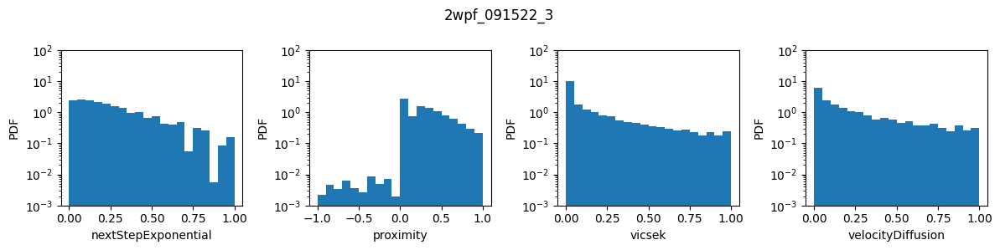

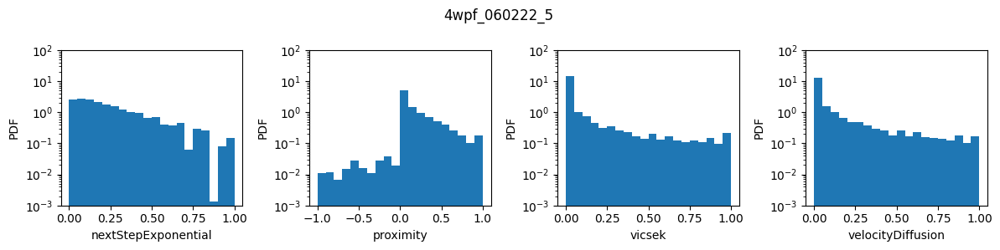

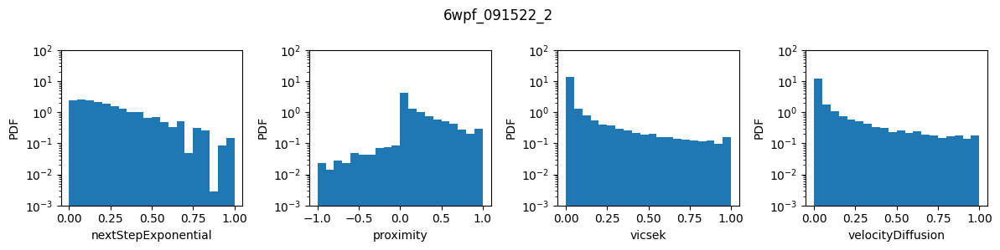

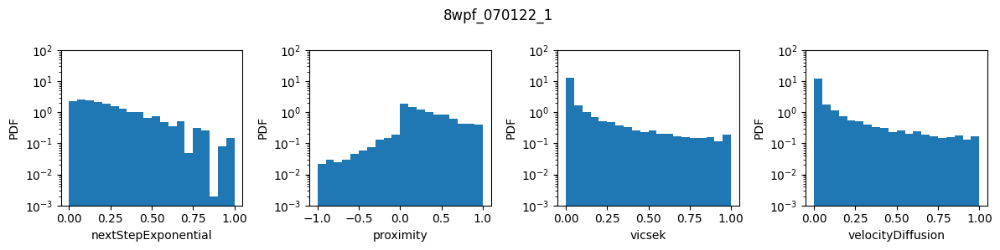

In [121]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [122]:
coefficients_raw = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 22:50:00,526 - Starting SVI inference with 1000 iterations.
2024-12-17 22:50:00,560 - Step 0, elbo loss: 143640.26603972324
2024-12-17 22:50:06,310 - Step 200, elbo loss: 111616.4660652854
2024-12-17 22:50:10,566 - Step 400, elbo loss: 108660.21233453747
2024-12-17 22:50:14,957 - Step 600, elbo loss: 107178.49866876009
2024-12-17 22:50:19,313 - Step 800, elbo loss: 106871.25483235298
2024-12-17 22:50:23,558 - SVI inference completed in 23.03 seconds.


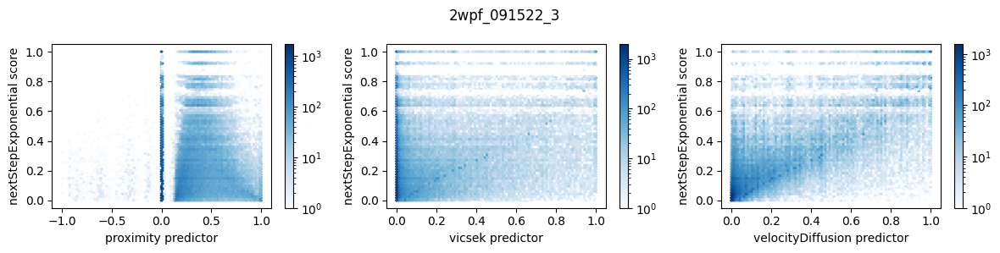

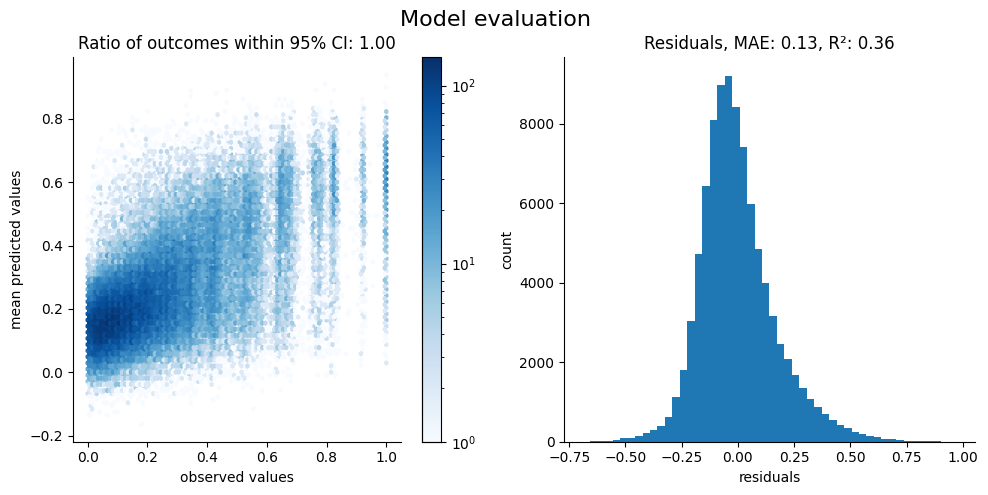

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 22:50:49,241 - Starting SVI inference with 1000 iterations.
2024-12-17 22:50:49,303 - Step 0, elbo loss: 288814.3441373501
2024-12-17 22:50:56,954 - Step 200, elbo loss: 237611.84221067344
2024-12-17 22:51:04,576 - Step 400, elbo loss: 231806.00727352942
2024-12-17 22:51:12,503 - Step 600, elbo loss: 231298.84550413958
2024-12-17 22:51:20,240 - Step 800, elbo loss: 229495.226152137
2024-12-17 22:51:30,314 - SVI inference completed in 41.07 seconds.


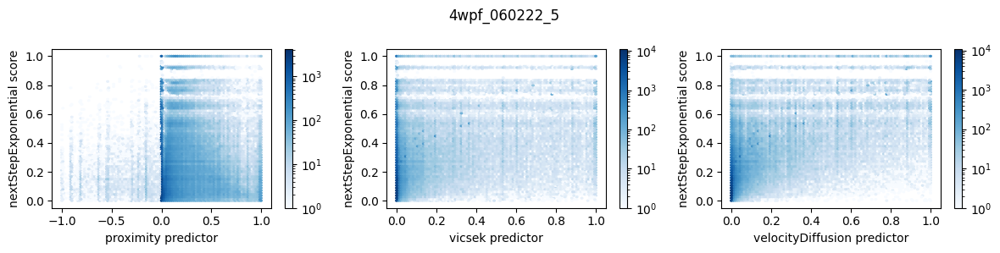

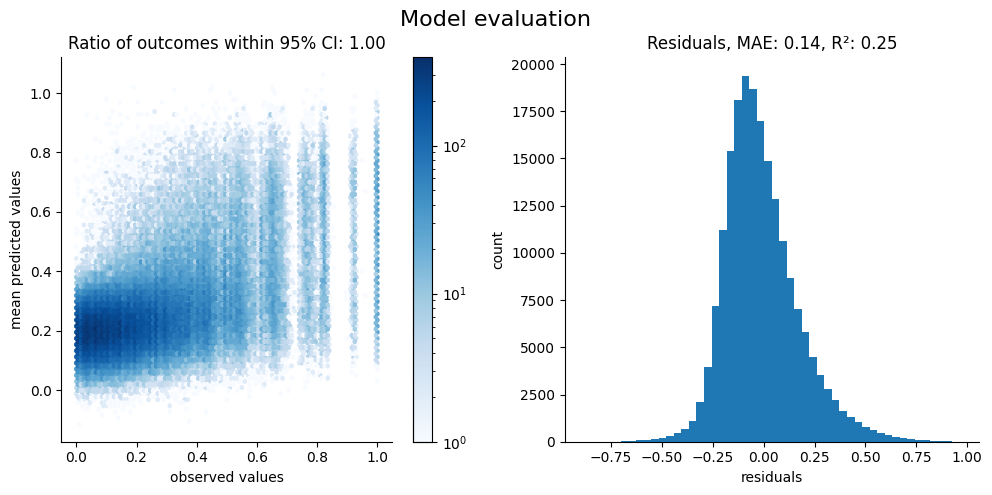

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 22:52:19,920 - Starting SVI inference with 1000 iterations.
2024-12-17 22:52:20,052 - Step 0, elbo loss: 578812.4244097668
2024-12-17 22:52:38,288 - Step 200, elbo loss: 458523.255944182
2024-12-17 22:53:17,029 - Step 400, elbo loss: 450675.9308681139
2024-12-17 22:53:34,797 - Step 600, elbo loss: 446492.8420336839
2024-12-17 22:53:55,633 - Step 800, elbo loss: 445521.64760732086
2024-12-17 22:54:12,885 - SVI inference completed in 112.96 seconds.


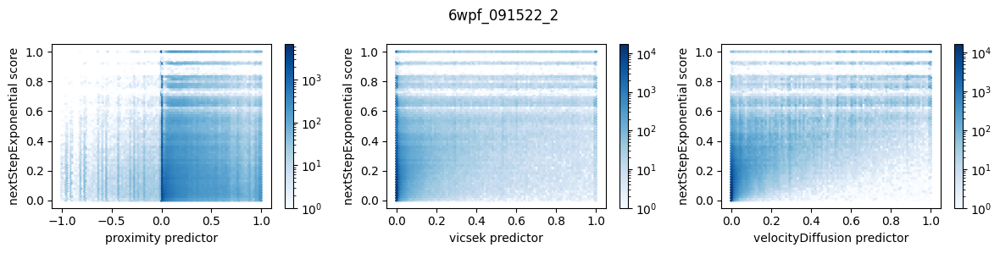

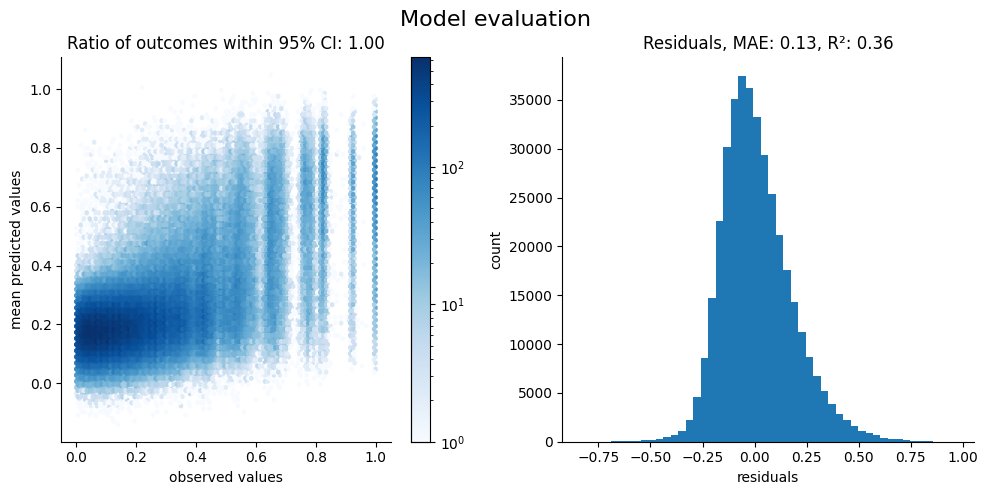

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 22:55:50,214 - Starting SVI inference with 1000 iterations.
2024-12-17 22:55:50,449 - Step 0, elbo loss: 1152244.770678641
2024-12-17 22:56:19,463 - Step 200, elbo loss: 939962.9585193369
2024-12-17 22:56:48,737 - Step 400, elbo loss: 912186.473468074
2024-12-17 22:57:18,978 - Step 600, elbo loss: 904845.7131265537
2024-12-17 22:57:50,895 - Step 800, elbo loss: 901409.7316380681
2024-12-17 22:58:26,116 - SVI inference completed in 155.90 seconds.


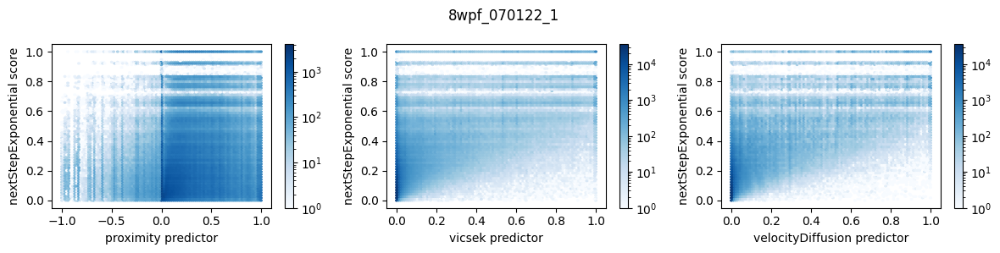

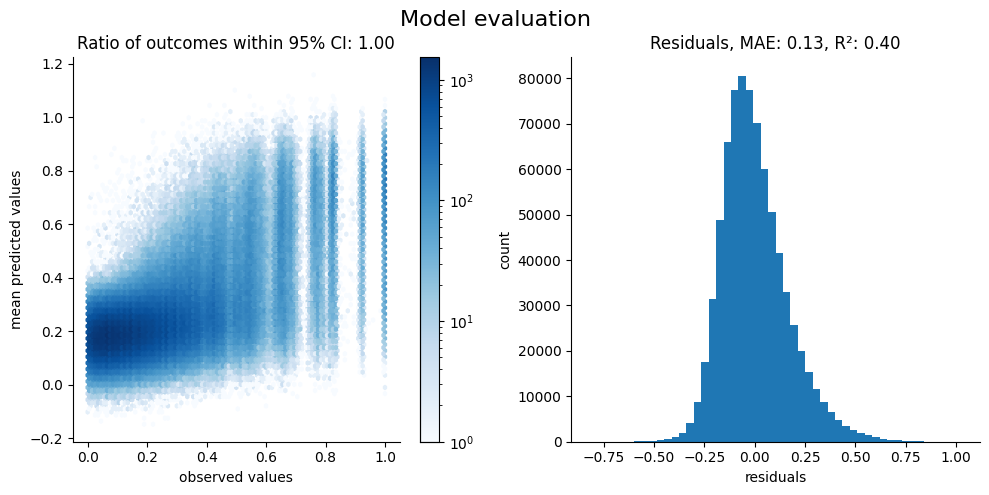

In [123]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw[exp] = samples

# Repeat for scaled scores

In [124]:
score_names = ["nextStepExponential_scaled"]
predictor_names = ["proximity_scaled", "vicsek_scaled", "velocityDiffusion_scaled"]

### Visualize the predictors and scores for each age

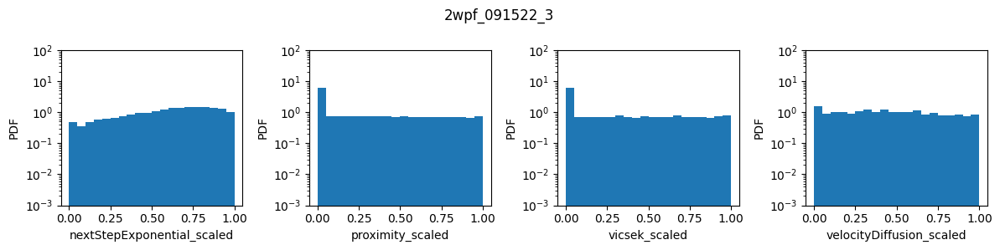

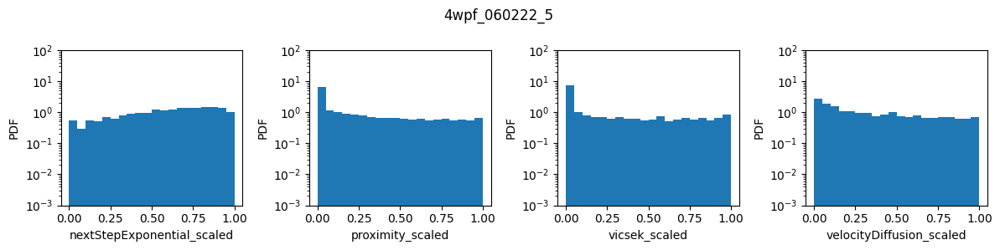

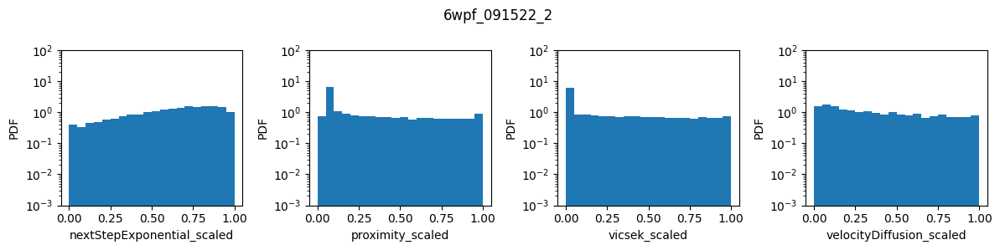

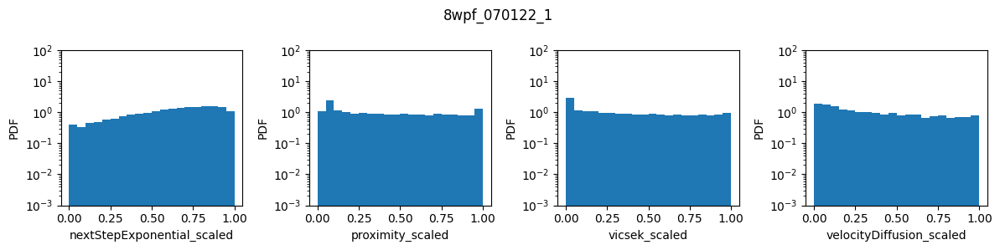

In [125]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [126]:
coefficients_scaled = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:00:07,150 - Starting SVI inference with 1000 iterations.
2024-12-17 23:00:07,188 - Step 0, elbo loss: 138231.58530602165
2024-12-17 23:00:12,178 - Step 200, elbo loss: 115320.22348883495
2024-12-17 23:00:19,436 - Step 400, elbo loss: 111630.57208914272
2024-12-17 23:00:24,947 - Step 600, elbo loss: 110268.14407365414
2024-12-17 23:00:30,572 - Step 800, elbo loss: 109610.5757106289
2024-12-17 23:00:36,339 - SVI inference completed in 29.19 seconds.


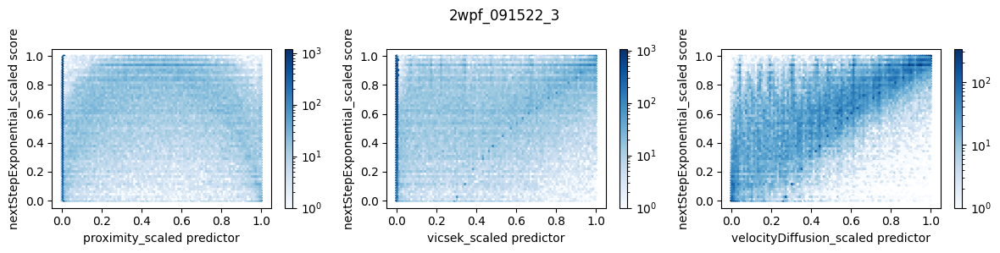

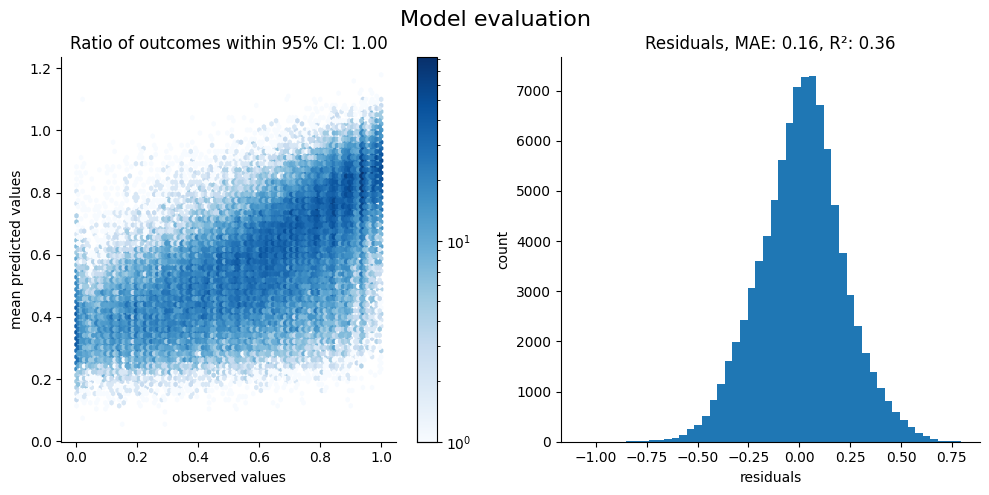

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:01:09,187 - Starting SVI inference with 1000 iterations.
2024-12-17 23:01:09,462 - Step 0, elbo loss: 301286.45345092
2024-12-17 23:01:19,180 - Step 200, elbo loss: 246047.27143531546
2024-12-17 23:01:28,194 - Step 400, elbo loss: 238871.89244679065
2024-12-17 23:01:37,412 - Step 600, elbo loss: 235578.4341494728
2024-12-17 23:01:46,681 - Step 800, elbo loss: 234438.2583981752
2024-12-17 23:01:56,952 - SVI inference completed in 47.76 seconds.


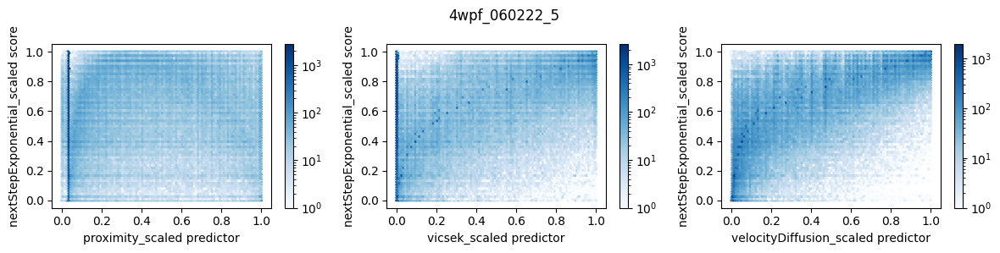

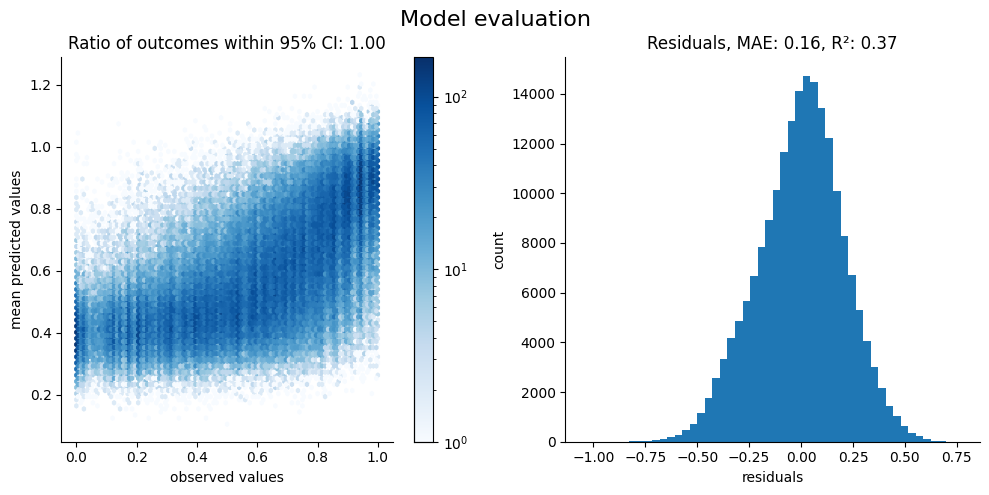

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:02:48,860 - Starting SVI inference with 1000 iterations.
2024-12-17 23:02:49,097 - Step 0, elbo loss: 686942.0992590172
2024-12-17 23:03:09,117 - Step 200, elbo loss: 487210.7777871167
2024-12-17 23:03:25,770 - Step 400, elbo loss: 460945.7666950889
2024-12-17 23:03:42,452 - Step 600, elbo loss: 455499.6252536244
2024-12-17 23:03:58,712 - Step 800, elbo loss: 454167.62865751475
2024-12-17 23:04:16,640 - SVI inference completed in 87.78 seconds.


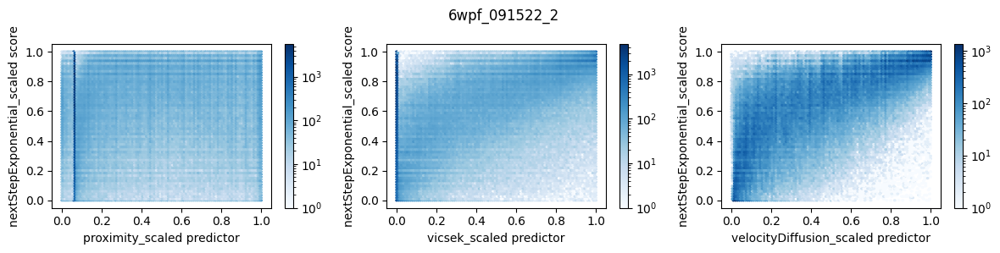

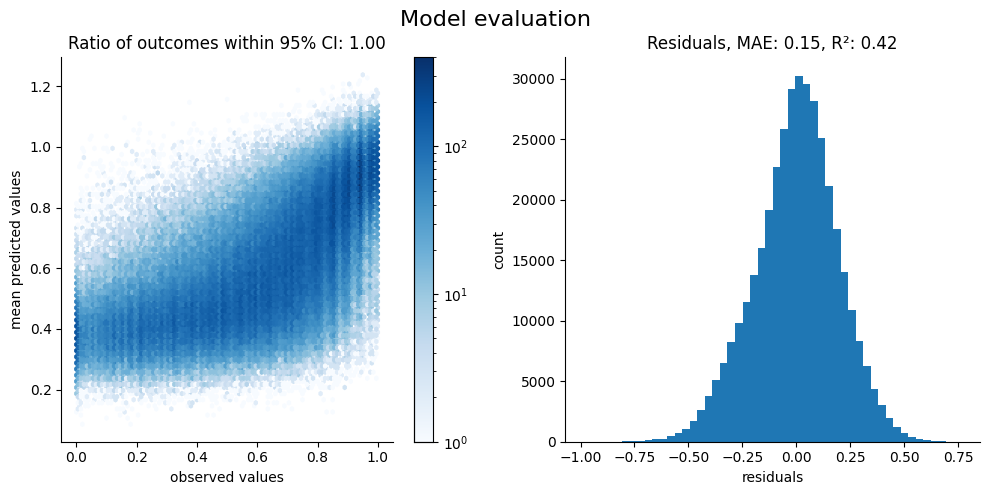

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:05:56,721 - Starting SVI inference with 1000 iterations.
2024-12-17 23:05:57,029 - Step 0, elbo loss: 1193710.9857613707
2024-12-17 23:06:28,003 - Step 200, elbo loss: 975203.2210471024
2024-12-17 23:06:59,301 - Step 400, elbo loss: 938871.4693332217
2024-12-17 23:07:30,780 - Step 600, elbo loss: 924386.3626514062
2024-12-17 23:08:01,908 - Step 800, elbo loss: 917144.7045997855
2024-12-17 23:08:30,407 - SVI inference completed in 153.68 seconds.


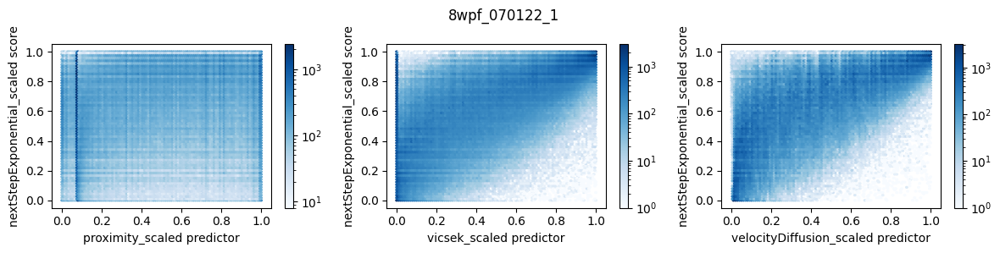

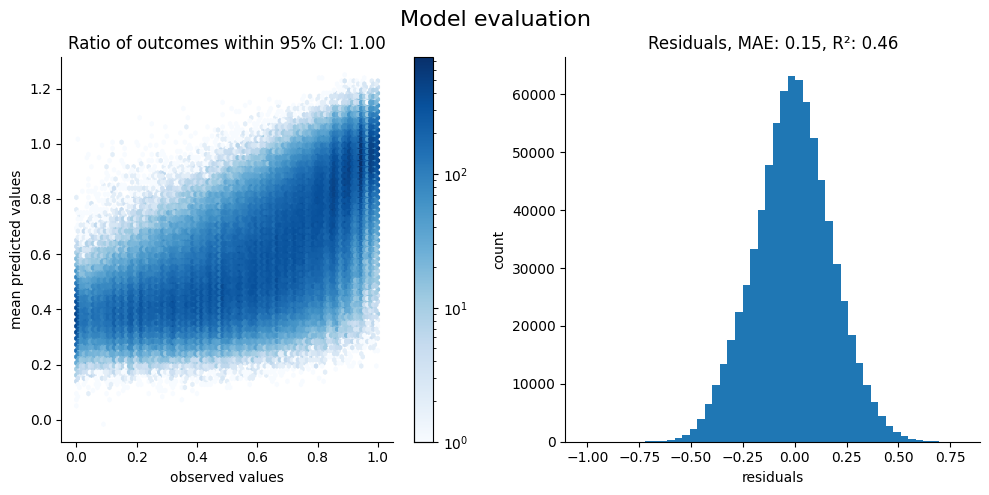

In [127]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled[exp] = samples

## Since big turns are rare in the data, it is possible that the contribution of `proximity` and `vicsek` are overshadowed by `velocityDiffusion`.
### Repeat above using only the first two predictors

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:09:43,353 - Starting SVI inference with 1000 iterations.
2024-12-17 23:09:43,381 - Step 0, elbo loss: 138891.62301159013
2024-12-17 23:09:47,250 - Step 200, elbo loss: 114036.14176113214
2024-12-17 23:09:51,292 - Step 400, elbo loss: 111122.56723783002
2024-12-17 23:09:56,531 - Step 600, elbo loss: 110545.01026503023
2024-12-17 23:10:00,439 - Step 800, elbo loss: 110017.3102372641
2024-12-17 23:10:04,292 - SVI inference completed in 20.94 seconds.


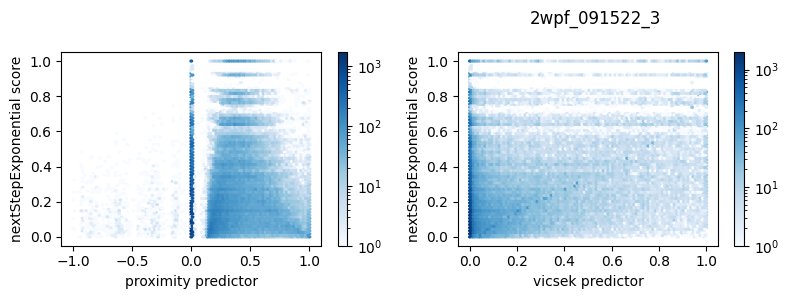

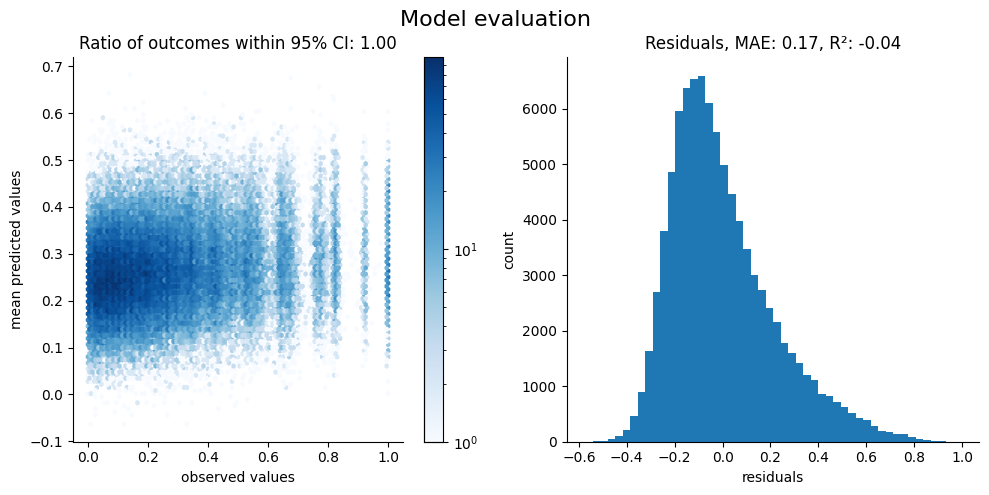

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:10:23,789 - Starting SVI inference with 1000 iterations.
2024-12-17 23:10:23,838 - Step 0, elbo loss: 284206.98269508954
2024-12-17 23:10:33,198 - Step 200, elbo loss: 239580.01420515712
2024-12-17 23:10:40,298 - Step 400, elbo loss: 235990.15035428276
2024-12-17 23:10:47,757 - Step 600, elbo loss: 234161.5869478712
2024-12-17 23:10:54,782 - Step 800, elbo loss: 233635.6907686799
2024-12-17 23:11:01,513 - SVI inference completed in 37.72 seconds.


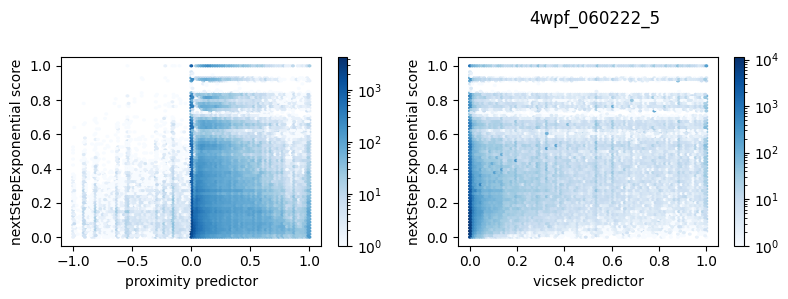

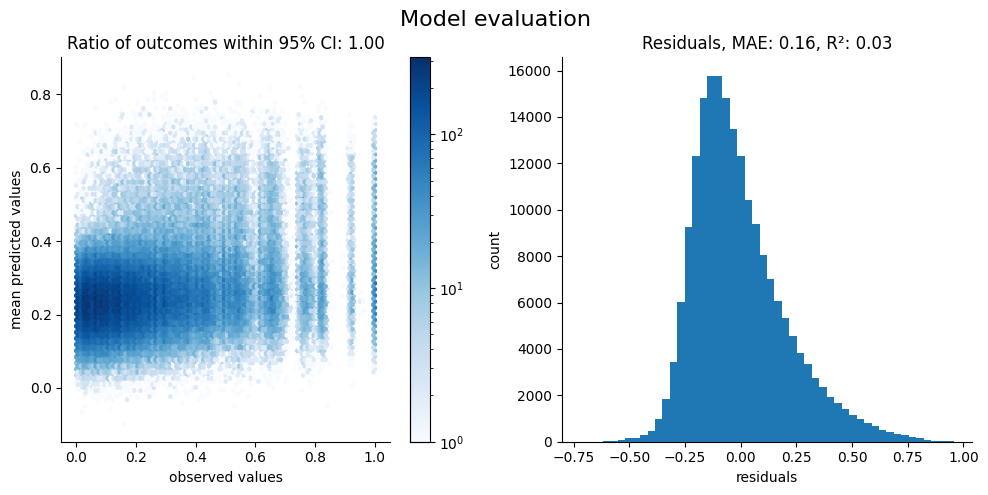

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:11:34,359 - Starting SVI inference with 1000 iterations.
2024-12-17 23:11:34,445 - Step 0, elbo loss: 593535.1437871316
2024-12-17 23:11:49,687 - Step 200, elbo loss: 468501.18783425586
2024-12-17 23:12:04,056 - Step 400, elbo loss: 459626.6895279455
2024-12-17 23:12:18,207 - Step 600, elbo loss: 458445.83648482215
2024-12-17 23:12:32,825 - Step 800, elbo loss: 455539.9131678391
2024-12-17 23:12:47,892 - SVI inference completed in 73.53 seconds.


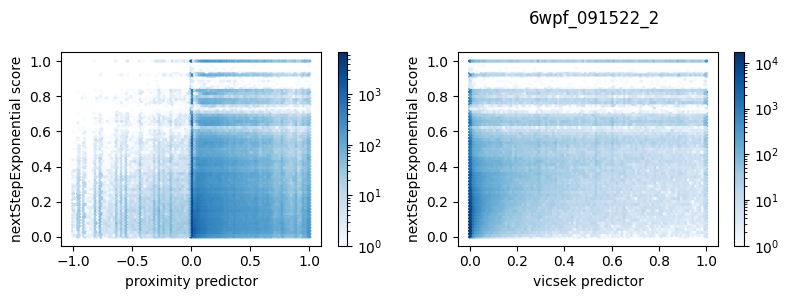

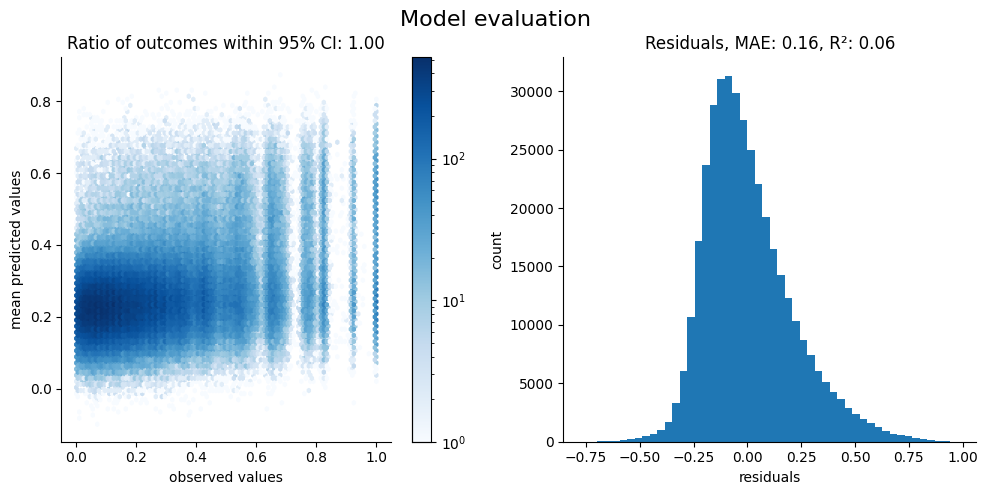

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:13:59,485 - Starting SVI inference with 1000 iterations.
2024-12-17 23:13:59,736 - Step 0, elbo loss: 1068134.0416852983
2024-12-17 23:14:28,431 - Step 200, elbo loss: 941205.5880554382
2024-12-17 23:14:57,336 - Step 400, elbo loss: 919224.8607231012
2024-12-17 23:15:25,194 - Step 600, elbo loss: 910875.703060132
2024-12-17 23:15:53,697 - Step 800, elbo loss: 907448.4185133178
2024-12-17 23:16:20,586 - SVI inference completed in 141.10 seconds.


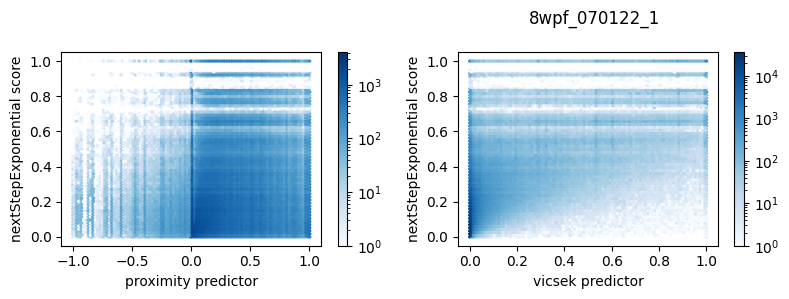

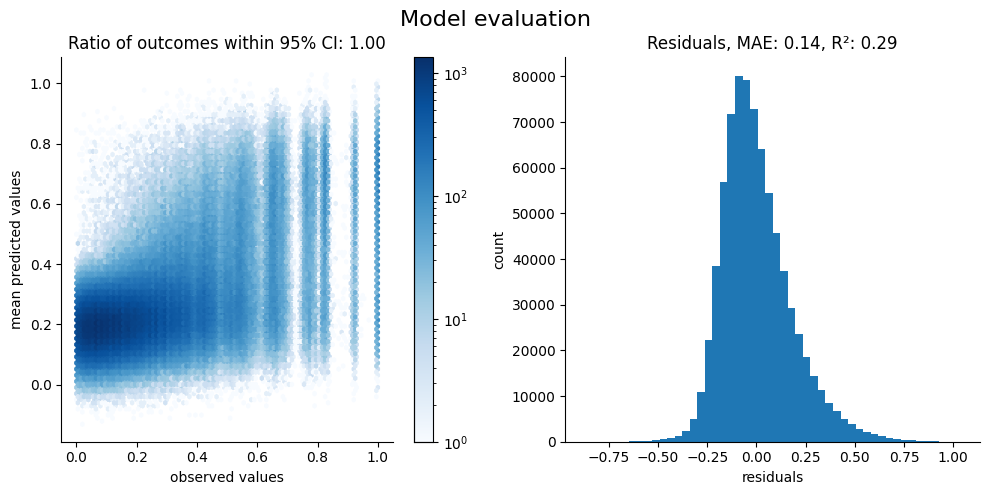

In [128]:
coefficients_raw_no_diffusion = {}
predictor_names = ["proximity", "vicsek"]
score_names = ["nextStepExponential"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw_no_diffusion[exp] = samples

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:17:33,569 - Starting SVI inference with 1000 iterations.
2024-12-17 23:17:33,603 - Step 0, elbo loss: 141664.06889651634
2024-12-17 23:17:38,560 - Step 200, elbo loss: 118664.95918718964
2024-12-17 23:17:43,006 - Step 400, elbo loss: 116406.43757171903
2024-12-17 23:17:47,097 - Step 600, elbo loss: 115138.31134519298
2024-12-17 23:17:50,936 - Step 800, elbo loss: 114430.68487510215
2024-12-17 23:17:54,785 - SVI inference completed in 21.22 seconds.


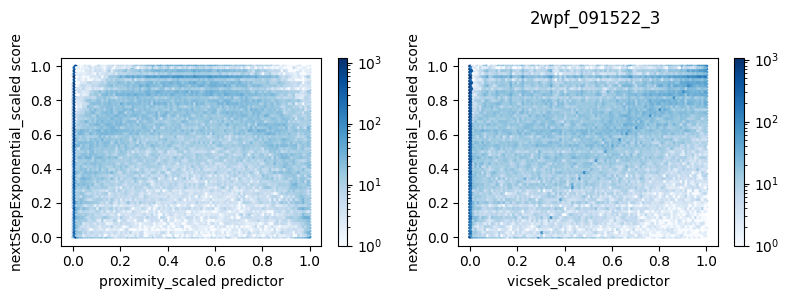

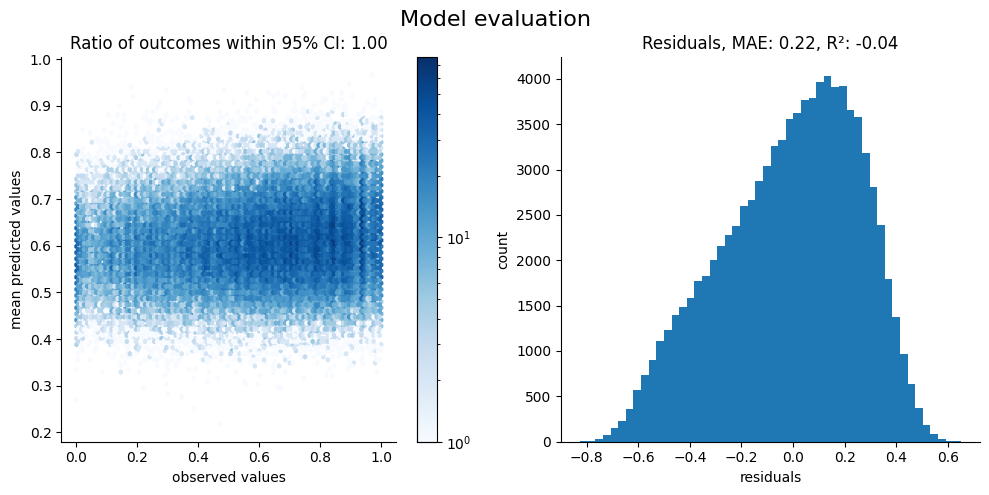

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:18:18,842 - Starting SVI inference with 1000 iterations.
2024-12-17 23:18:18,900 - Step 0, elbo loss: 309773.84678435035
2024-12-17 23:18:27,072 - Step 200, elbo loss: 250032.94777212135
2024-12-17 23:18:35,210 - Step 400, elbo loss: 244530.56970614468
2024-12-17 23:18:43,019 - Step 600, elbo loss: 243168.18460634595
2024-12-17 23:18:51,137 - Step 800, elbo loss: 242567.60112940622
2024-12-17 23:18:58,826 - SVI inference completed in 39.98 seconds.


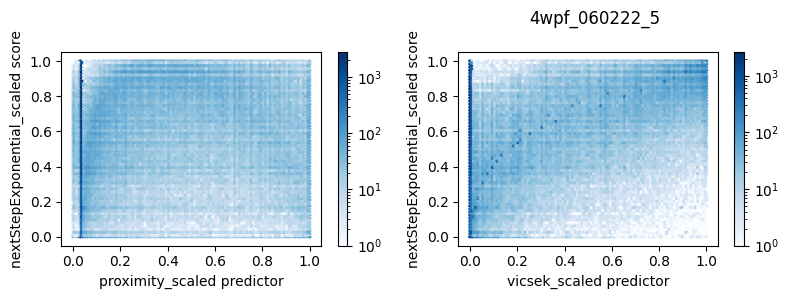

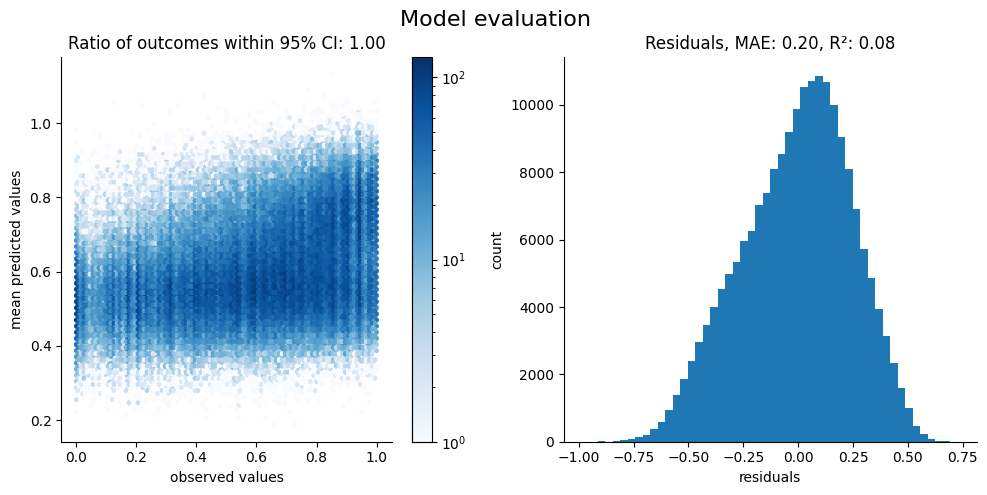

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:19:36,703 - Starting SVI inference with 1000 iterations.
2024-12-17 23:19:36,838 - Step 0, elbo loss: 596882.9310543275
2024-12-17 23:19:50,946 - Step 200, elbo loss: 487603.9797219615
2024-12-17 23:20:05,111 - Step 400, elbo loss: 477339.1568248662
2024-12-17 23:20:19,162 - Step 600, elbo loss: 472278.6381601966
2024-12-17 23:20:33,661 - Step 800, elbo loss: 470665.3532408241
2024-12-17 23:20:49,742 - SVI inference completed in 73.04 seconds.


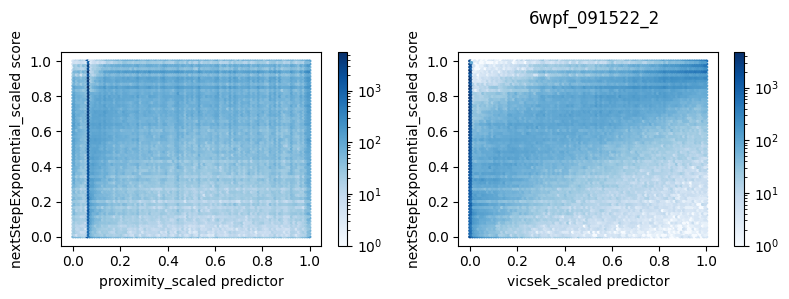

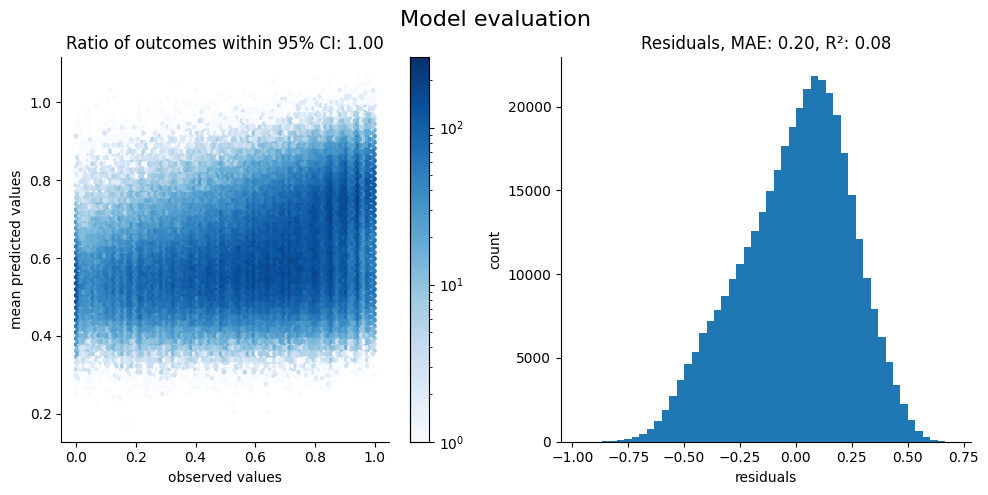

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:22:03,831 - Starting SVI inference with 1000 iterations.
2024-12-17 23:22:03,995 - Step 0, elbo loss: 1135891.1655552941
2024-12-17 23:22:29,721 - Step 200, elbo loss: 978581.0561080487
2024-12-17 23:22:56,820 - Step 400, elbo loss: 946899.8930773851
2024-12-17 23:23:23,395 - Step 600, elbo loss: 935418.058355509
2024-12-17 23:23:50,094 - Step 800, elbo loss: 930089.5168589025
2024-12-17 23:24:16,240 - SVI inference completed in 132.41 seconds.


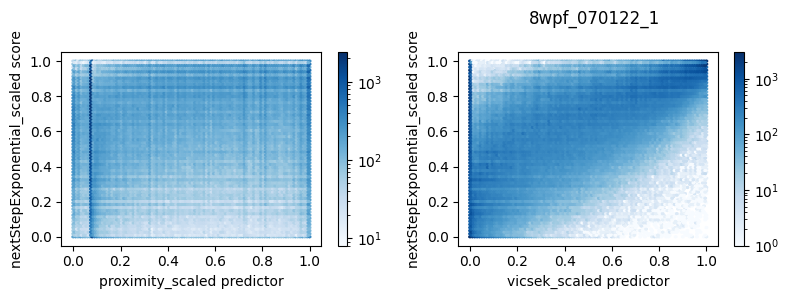

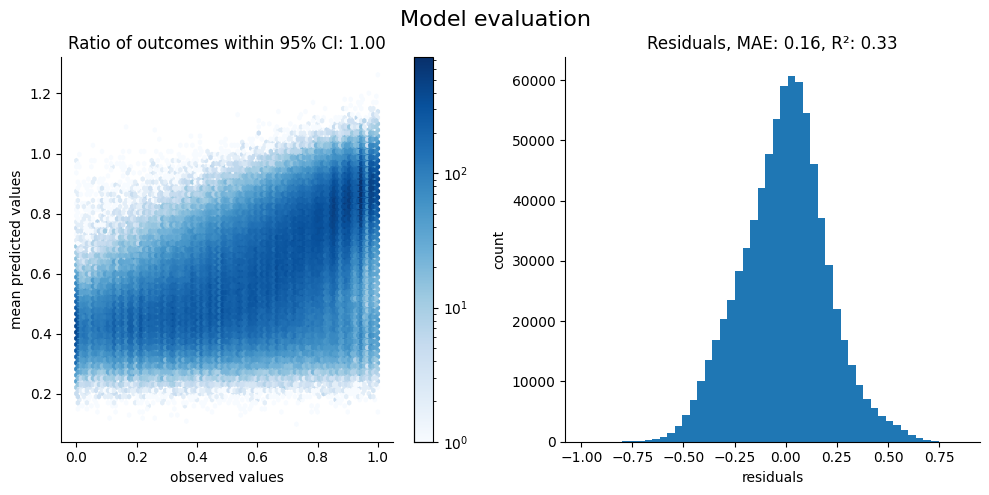

In [129]:
coefficients_scaled_no_diffusion = {}
predictor_names = ["proximity_scaled", "vicsek_scaled"]
score_names = ["nextStepExponential_scaled"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled_no_diffusion[exp] = samples

In [130]:
def plot_comparative_results(samples,title):
    fig, ax = plt.subplots(1,1, figsize=(5,5))
    ax.axhline(0,linestyle="--",color='k')
    ax.axvline(0,linestyle="--",color='k')

    for exp,sample in samples.items():
        try:
            p = sample["weight_proximity"]
            v = sample["weight_vicsek"]
        except KeyError:
            p = sample["weight_proximity_scaled"]
            v = sample["weight_vicsek_scaled"]

        ax.scatter(p,v,alpha=0.3,label=exp,s=5)

    ax.set_xlabel("proximity coefficient")
    ax.set_ylabel("vicsek coefficient")
    ax.set_xlim([-0.2,0.6])
    ax.set_ylim([-0.2,0.6])
    ax.legend()
    fig.suptitle(title)

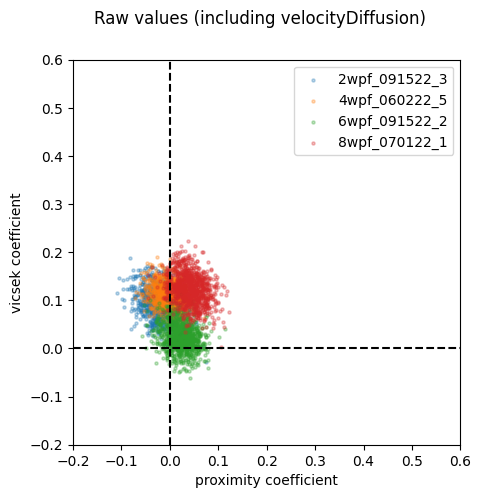

In [131]:
plot_comparative_results(coefficients_raw,"Raw values (including velocityDiffusion)")

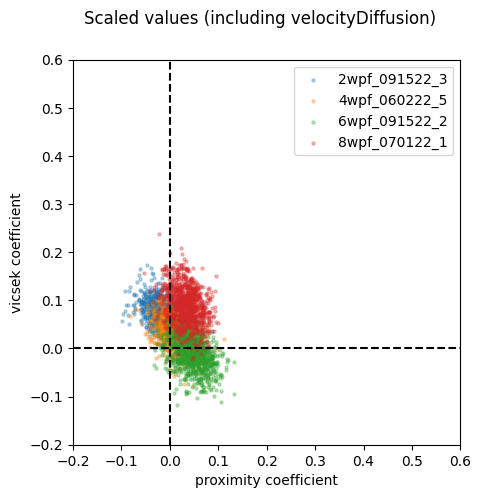

In [132]:
plot_comparative_results(coefficients_scaled,"Scaled values (including velocityDiffusion)")

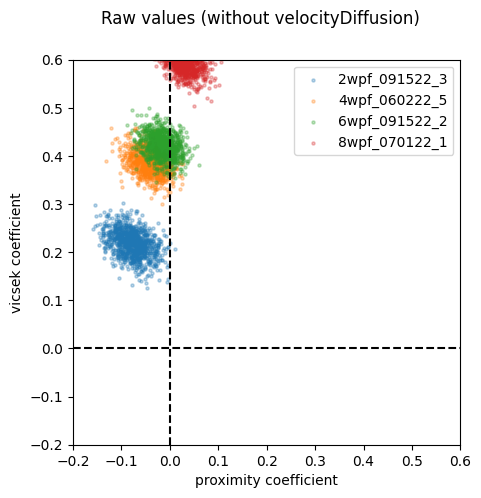

In [133]:
plot_comparative_results(coefficients_raw_no_diffusion,"Raw values (without velocityDiffusion)")

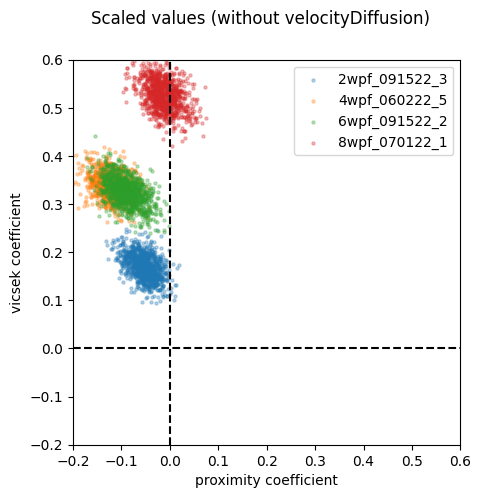

In [134]:
plot_comparative_results(coefficients_scaled_no_diffusion,"Scaled values (without velocityDiffusion)")